# TBM Forecasting with Transformer Model

This notebook implements a Transformer-based time series forecasting model for TBM (Tunnel Boring Machine) data.

## Model Architecture
- **Input**: 5 time steps (sequence_length=5)
- **Output**: 1 time step prediction
- **Model**: Transformer Encoder

In [1]:
# ============================================================================
# CONFIGURATION SECTION - 可配置区域
# ============================================================================

# Model Hyperparameters - 模型超参数
CONFIG = {
    # Data Configuration
    'data_path': '../01-Preprocessing/data_preprocessed.csv',
    'sequence_length': 5,  # 使用5个时间步预测下一个时间步
    'prediction_length': 1,  # 预测1个时间步
    'test_size': 0.2,  # 测试集比例
    'val_size': 0.1,  # 验证集比例
    'random_state': 42,
    
    # Model Architecture
    'd_model': 128,  # Transformer模型维度
    'nhead': 8,  # 注意力头数
    'num_encoder_layers': 3,  # 编码器层数
    'dim_feedforward': 512,  # 前馈网络维度
    'dropout': 0.1,  # Dropout率
    'activation': 'relu',  # 激活函数
    
    # Training Hyperparameters
    'batch_size': 64,
    'learning_rate': 0.001,
    'num_epochs': 100,
    'early_stopping_patience': 10,  # 早停耐心值
    'weight_decay': 1e-5,  # L2正则化
    
    # Device
    'device': 'cuda' if __import__('torch').cuda.is_available() else 'cpu',
    
    # Font Configuration - 字体配置
    'font_config': {
        'chinese_font': 'SimSun',  # 中文使用宋体
        'english_font': 'Times New Roman',  # 英文和数字使用Times字体
        'chinese_fontsize': 18,  # 中文字体大小
        'english_fontsize': 17,  # 英文字体大小
        'title_fontsize': 20,  # 标题字体大小
        'label_fontsize': 18,  # 标签字体大小
        'legend_fontsize': 16,  # 图例字体大小
        'tick_fontsize': 16,  # 刻度字体大小
    },
    
    # Plot Configuration - 绘图配置
    'plot_config': {
        'figsize': (12, 6),
        'dpi': 100,
        'style': 'seaborn-v0_8-darkgrid',
        'save_format': 'png',
        'save_dpi': 300,
    },
    
    # Output Configuration
    'save_model': True,
    'model_save_path': './models/transformer_model.pth',
    'save_predictions': True,
    'predictions_save_path': './results/predictions.csv',
    'save_plots': True,
    'plots_save_path': './results/plots/',
}

print("Configuration loaded successfully!")
print(f"Device: {CONFIG['device']}")
print(f"Sequence Length: {CONFIG['sequence_length']}")
print(f"Model Dimension: {CONFIG['d_model']}")

Configuration loaded successfully!
Device: cuda
Sequence Length: 5
Model Dimension: 128


In [2]:
# ============================================================================
# IMPORTS - 导入库
# ============================================================================

import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import seaborn as sns
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Set random seeds for reproducibility
np.random.seed(CONFIG['random_state'])
torch.manual_seed(CONFIG['random_state'])
if torch.cuda.is_available():
    torch.cuda.manual_seed(CONFIG['random_state'])
    torch.cuda.manual_seed_all(CONFIG['random_state'])

print("Libraries imported successfully!")
print(f"PyTorch version: {torch.__version__}")
print(f"NumPy version: {np.__version__}")
print(f"Pandas version: {pd.__version__}")

Libraries imported successfully!
PyTorch version: 2.6.0+cu126
NumPy version: 2.1.3
Pandas version: 2.2.3


In [3]:
# ============================================================================
# FONT SETUP - 字体设置
# ============================================================================

def setup_fonts():
    """
    设置中文字体（宋体）和英文字体（Times New Roman）
    """
    import platform
    
    # 获取中文字体路径
    chinese_font_name = CONFIG['font_config']['chinese_font']
    english_font_name = CONFIG['font_config']['english_font']
    
    # 查找可用字体
    available_fonts = [f.name for f in fm.fontManager.ttflist]
    font_paths = {f.name: f.fname for f in fm.fontManager.ttflist}
    
    # Windows系统宋体路径
    chinese_font_path = None
    if platform.system() == 'Windows':
        # 尝试多个可能的宋体路径
        possible_paths = [
            r'C:\Windows\Fonts\simsun.ttc',
            r'C:\Windows\Fonts\simsun.ttf',
            r'C:\Windows\Fonts\SIMSUN.TTC',
            r'C:\Windows\Fonts\SIMSUN.TTF',
        ]
        for path in possible_paths:
            if os.path.exists(path):
                chinese_font_path = path
                break
    
    # 设置中文字体
    chinese_font_found = False
    if chinese_font_name in available_fonts:
        plt.rcParams['font.sans-serif'] = [chinese_font_name, 'SimSun', 'SimHei', 'Microsoft YaHei']
        chinese_font_found = True
        print(f"Found Chinese font: {chinese_font_name}")
    elif chinese_font_path:
        # 直接使用字体文件路径
        try:
            font_prop = fm.FontProperties(fname=chinese_font_path)
            plt.rcParams['font.sans-serif'] = [font_prop.get_name(), 'SimSun', 'SimHei', 'Microsoft YaHei']
            chinese_font_found = True
            print(f"Loaded Chinese font from: {chinese_font_path}")
        except:
            pass
    
    if not chinese_font_found:
        # 尝试其他常见中文字体
        chinese_fonts = ['SimHei', 'Microsoft YaHei', 'KaiTi', 'FangSong', 'STSong']
        for font in chinese_fonts:
            if font in available_fonts:
                plt.rcParams['font.sans-serif'] = [font] + plt.rcParams.get('font.sans-serif', [])
                print(f"Using alternative Chinese font: {font}")
                chinese_font_found = True
                break
    
    # 设置英文字体
    if english_font_name in available_fonts:
        plt.rcParams['font.serif'] = [english_font_name, 'Times New Roman', 'Times']
        print(f"Found English font: {english_font_name}")
    else:
        plt.rcParams['font.serif'] = ['Times New Roman', 'Times', 'DejaVu Serif']
        print(f"Using default serif font")
    
    # 解决负号显示问题
    plt.rcParams['axes.unicode_minus'] = False
    
    # 设置默认字体大小
    plt.rcParams['font.size'] = CONFIG['font_config']['english_fontsize']
    
    # 存储字体属性供后续使用
    CONFIG['_chinese_font_prop'] = fm.FontProperties(family=plt.rcParams['font.sans-serif'][0] if plt.rcParams['font.sans-serif'] else 'sans-serif',
                                                      size=CONFIG['font_config']['chinese_fontsize'])
    CONFIG['_english_font_prop'] = fm.FontProperties(family=plt.rcParams['font.serif'][0] if plt.rcParams['font.serif'] else 'serif',
                                                      size=CONFIG['font_config']['english_fontsize'])
    
    print("Fonts configured successfully!")
    print(f"Chinese font family: {plt.rcParams['font.sans-serif'][:3]}")
    print(f"English font family: {plt.rcParams['font.serif'][:3]}")

setup_fonts()

Found Chinese font: SimSun
Found English font: Times New Roman
Fonts configured successfully!
Chinese font family: ['SimSun', 'SimSun', 'SimHei']
English font family: ['Times New Roman', 'Times New Roman', 'Times']


In [4]:
# ============================================================================
# DATA LOADING AND PREPROCESSING - 数据加载和预处理模块
# ============================================================================

class TBMDataLoader:
    """
    数据加载和预处理类
    """
    def __init__(self, config):
        self.config = config
        self.scaler = StandardScaler()
        self.feature_columns = None
        
    def load_data(self):
        """
        加载CSV数据
        """
        print(f"Loading data from: {self.config['data_path']}")
        df = pd.read_csv(self.config['data_path'], encoding='utf-8')
        
        # 跳过单位行（第二行）
        if len(df) > 1:
            df = df.iloc[1:].reset_index(drop=True)
        
        print(f"Data shape: {df.shape}")
        print(f"Columns: {df.columns.tolist()}")
        
        return df
    
    def preprocess_data(self, df):
        """
        数据预处理
        - 选择数值特征
        - 处理缺失值
        - 数据标准化
        """
        # 选择数值特征（排除非数值列）
        numeric_columns = []
        exclude_columns = ['管片号码', '记录日期', '记录时刻', '系统掘进状态']
        
        for col in df.columns:
            if col not in exclude_columns:
                try:
                    df[col] = pd.to_numeric(df[col], errors='coerce')
                    numeric_columns.append(col)
                except:
                    pass
        
        self.feature_columns = numeric_columns
        print(f"Selected {len(numeric_columns)} numeric features")
        
        # 处理缺失值
        df[numeric_columns] = df[numeric_columns].ffill().bfill().fillna(0)
        
        # 提取特征数据
        data = df[numeric_columns].values.astype(np.float32)
        
        # 数据标准化
        data_scaled = self.scaler.fit_transform(data)
        
        print(f"Data preprocessed. Shape: {data_scaled.shape}")
        return data_scaled
    
    def create_sequences(self, data):
        """
        创建时间序列序列
        使用sequence_length个时间步预测下一个时间步
        """
        sequences = []
        targets = []
        
        seq_len = self.config['sequence_length']
        pred_len = self.config['prediction_length']
        
        for i in range(len(data) - seq_len - pred_len + 1):
            seq = data[i:i+seq_len]
            target = data[i+seq_len:i+seq_len+pred_len]
            sequences.append(seq)
            targets.append(target)
        
        sequences = np.array(sequences)
        targets = np.array(targets)
        
        print(f"Created sequences. Input shape: {sequences.shape}, Target shape: {targets.shape}")
        return sequences, targets

# 初始化数据加载器
data_loader = TBMDataLoader(CONFIG)

# 加载数据
raw_data = data_loader.load_data()

# 预处理数据
processed_data = data_loader.preprocess_data(raw_data)

# 创建序列
X, y = data_loader.create_sequences(processed_data)

print(f"\nFinal data shapes:")
print(f"X (sequences): {X.shape}")
print(f"y (targets): {y.shape}")

Loading data from: ../01-Preprocessing/data_preprocessed.csv
Data shape: (42374, 35)
Columns: ['管片号码', '管理行程', '记录日期', '记录时刻', '系统掘进状态', '贯入度', '推进区间的压力（上）', '推进区间的压力（右）', '推进区间的压力（下）', '推进区间的压力（左）', '土舱土压（右下）', '土舱土压（左下）', 'No.16推进千斤顶速度', 'No.4推进千斤顶速度', 'No.8推进千斤顶速度', 'No.12推进千斤顶速度', '推进油缸总推力', 'No.16推进千斤顶行程', 'No.4推进千斤顶行程', 'No.8推进千斤顶行程', 'No.12推进千斤顶行程', '千斤顶行程差 上下', '推进平均速度', '刀盘转速', '刀盘扭矩', 'No.1刀盘电机扭矩', 'No.2刀盘电机扭矩', 'No.3刀盘电机扭矩', 'No.4刀盘电机扭矩', 'No.5刀盘电机扭矩', 'No.6刀盘电机扭矩', 'No.7刀盘电机扭矩', 'No.8刀盘电机扭矩', 'No.9刀盘电机扭矩', 'No.10刀盘电机扭矩']
Selected 31 numeric features
Data preprocessed. Shape: (42374, 31)
Created sequences. Input shape: (42369, 5, 31), Target shape: (42369, 1, 31)

Final data shapes:
X (sequences): (42369, 5, 31)
y (targets): (42369, 1, 31)


In [5]:
# ============================================================================
# DATASET AND DATALOADER - 数据集和数据加载器
# ============================================================================

class TimeSeriesDataset(Dataset):
    """
    时间序列数据集类
    """
    def __init__(self, sequences, targets):
        self.sequences = torch.FloatTensor(sequences)
        self.targets = torch.FloatTensor(targets)
    
    def __len__(self):
        return len(self.sequences)
    
    def __getitem__(self, idx):
        return self.sequences[idx], self.targets[idx]

# 划分数据集 - 测试集使用后50%的数据
total_samples = len(X)
train_val_split_idx = int(total_samples * 0.5)  # 前50%用于训练和验证，后50%用于测试

# 前50%：训练集和验证集
X_train_val = X[:train_val_split_idx]
y_train_val = y[:train_val_split_idx]

# 后50%：测试集
X_test = X[train_val_split_idx:]
y_test = y[train_val_split_idx:]

# 从前50%中划分训练集和验证集
val_size_ratio = CONFIG['val_size'] / (1 - 0.5)  # 调整验证集比例
X_train, X_val, y_train, y_val = train_test_split(
    X_train_val, y_train_val, test_size=val_size_ratio,
    random_state=CONFIG['random_state'], shuffle=False
)

# 创建数据集
train_dataset = TimeSeriesDataset(X_train, y_train)
val_dataset = TimeSeriesDataset(X_val, y_val)
test_dataset = TimeSeriesDataset(X_test, y_test)

# 创建数据加载器
train_loader = DataLoader(
    train_dataset, 
    batch_size=CONFIG['batch_size'], 
    shuffle=True,
    num_workers=0
)
val_loader = DataLoader(
    val_dataset, 
    batch_size=CONFIG['batch_size'], 
    shuffle=False,
    num_workers=0
)
test_loader = DataLoader(
    test_dataset, 
    batch_size=CONFIG['batch_size'], 
    shuffle=False,
    num_workers=0
)

print(f"Dataset sizes:")
print(f"Train: {len(train_dataset)}")
print(f"Validation: {len(val_dataset)}")
print(f"Test: {len(test_dataset)}")

Dataset sizes:
Train: 16947
Validation: 4237
Test: 21185


In [6]:
# ============================================================================
# MODEL DEFINITION - 模型定义模块
# ============================================================================

class PositionalEncoding(nn.Module):
    """
    位置编码模块
    """
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)
        
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-np.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)
    
    def forward(self, x):
        # x shape: (batch_size, seq_len, d_model)
        x = x + self.pe[:x.size(1), :].transpose(0, 1)
        return self.dropout(x)


class TransformerForecaster(nn.Module):
    """
    Transformer时间序列预测模型
    """
    def __init__(self, config, input_dim):
        super(TransformerForecaster, self).__init__()
        self.config = config
        self.input_dim = input_dim
        self.d_model = config['d_model']
        
        # 输入投影层
        self.input_projection = nn.Linear(input_dim, self.d_model)
        
        # 位置编码
        self.pos_encoder = PositionalEncoding(self.d_model, config['dropout'])
        
        # Transformer编码器
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=self.d_model,
            nhead=config['nhead'],
            dim_feedforward=config['dim_feedforward'],
            dropout=config['dropout'],
            activation=config['activation'],
            batch_first=True
        )
        self.transformer_encoder = nn.TransformerEncoder(
            encoder_layer, 
            num_layers=config['num_encoder_layers']
        )
        
        # 输出投影层
        self.output_projection = nn.Linear(
            self.d_model, 
            input_dim * config['prediction_length']
        )
        
    def forward(self, x):
        # x shape: (batch_size, seq_len, input_dim)
        batch_size, seq_len, _ = x.shape
        
        # 输入投影
        x = self.input_projection(x)  # (batch_size, seq_len, d_model)
        
        # 位置编码
        x = self.pos_encoder(x)
        
        # Transformer编码
        x = self.transformer_encoder(x)  # (batch_size, seq_len, d_model)
        
        # 使用最后一个时间步的输出
        x = x[:, -1, :]  # (batch_size, d_model)
        
        # 输出投影
        output = self.output_projection(x)  # (batch_size, input_dim * prediction_length)
        
        # 重塑输出
        output = output.view(batch_size, self.config['prediction_length'], self.input_dim)
        
        return output

# 初始化模型
input_dim = X.shape[2]  # 特征维度
model = TransformerForecaster(CONFIG, input_dim).to(CONFIG['device'])

# 打印模型信息
print(f"Model initialized on {CONFIG['device']}")
print(f"Input dimension: {input_dim}")
print(f"Model parameters: {sum(p.numel() for p in model.parameters()):,}")
print(f"Trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")

# 打印模型结构
print("\nModel architecture:")
print(model)

Model initialized on cuda
Input dimension: 31
Model parameters: 602,911
Trainable parameters: 602,911

Model architecture:
TransformerForecaster(
  (input_projection): Linear(in_features=31, out_features=128, bias=True)
  (pos_encoder): PositionalEncoding(
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (transformer_encoder): TransformerEncoder(
    (layers): ModuleList(
      (0-2): 3 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
        )
        (linear1): Linear(in_features=128, out_features=512, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
        (linear2): Linear(in_features=512, out_features=128, bias=True)
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.1, inplace=False)
        (dropout2): Dropout(p=0.1, inplace=Fa

In [7]:
# ============================================================================
# TRAINING MODULE - 训练模块
# ============================================================================

class ModelTrainer:
    """
    模型训练类
    """
    def __init__(self, model, config, train_loader, val_loader):
        self.model = model
        self.config = config
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.device = config['device']
        
        # 损失函数
        self.criterion = nn.MSELoss()
        
        # 优化器
        self.optimizer = optim.Adam(
            model.parameters(),
            lr=config['learning_rate'],
            weight_decay=config['weight_decay']
        )
        
        # 学习率调度器
        self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            self.optimizer, mode='min', factor=0.5, patience=5, verbose=True
        )
        
        # 训练历史
        self.train_losses = []
        self.val_losses = []
        self.best_val_loss = float('inf')
        self.patience_counter = 0
        
    def train_epoch(self):
        """
        训练一个epoch
        """
        self.model.train()
        total_loss = 0
        
        for batch_idx, (sequences, targets) in enumerate(self.train_loader):
            sequences = sequences.to(self.device)
            targets = targets.to(self.device)
            
            # 前向传播
            self.optimizer.zero_grad()
            predictions = self.model(sequences)
            
            # 计算损失
            loss = self.criterion(predictions, targets)
            
            # 反向传播
            loss.backward()
            torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1.0)
            self.optimizer.step()
            
            total_loss += loss.item()
        
        avg_loss = total_loss / len(self.train_loader)
        return avg_loss
    
    def validate(self):
        """
        验证模型
        """
        self.model.eval()
        total_loss = 0
        
        with torch.no_grad():
            for sequences, targets in self.val_loader:
                sequences = sequences.to(self.device)
                targets = targets.to(self.device)
                
                predictions = self.model(sequences)
                loss = self.criterion(predictions, targets)
                
                total_loss += loss.item()
        
        avg_loss = total_loss / len(self.val_loader)
        return avg_loss
    
    def train(self):
        """
        完整训练流程
        """
        print("Starting training...")
        print(f"Device: {self.device}")
        print(f"Number of epochs: {self.config['num_epochs']}")
        print("-" * 60)
        
        for epoch in range(self.config['num_epochs']):
            # 训练
            train_loss = self.train_epoch()
            self.train_losses.append(train_loss)
            
            # 验证
            val_loss = self.validate()
            self.val_losses.append(val_loss)
            
            # 学习率调度
            self.scheduler.step(val_loss)
            
            # 早停检查
            if val_loss < self.best_val_loss:
                self.best_val_loss = val_loss
                self.patience_counter = 0
                # 保存最佳模型
                if self.config['save_model']:
                    self.save_model()
            else:
                self.patience_counter += 1
            
            # 打印进度
            if (epoch + 1) % 10 == 0 or epoch == 0:
                print(f"Epoch [{epoch+1}/{self.config['num_epochs']}]")
                print(f"  Train Loss: {train_loss:.6f}")
                print(f"  Val Loss: {val_loss:.6f}")
                print(f"  Best Val Loss: {self.best_val_loss:.6f}")
                print(f"  LR: {self.optimizer.param_groups[0]['lr']:.8f}")
                print("-" * 60)
            
            # 早停
            if self.patience_counter >= self.config['early_stopping_patience']:
                print(f"\nEarly stopping at epoch {epoch+1}")
                break
        
        print("\nTraining completed!")
        return self.train_losses, self.val_losses
    
    def save_model(self):
        """
        保存模型
        """
        save_path = self.config['model_save_path']
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict(),
            'config': self.config,
            'best_val_loss': self.best_val_loss,
        }, save_path)
        print(f"Model saved to {save_path}")

# 初始化训练器
trainer = ModelTrainer(model, CONFIG, train_loader, val_loader)

# 开始训练
train_losses, val_losses = trainer.train()

Starting training...
Device: cuda
Number of epochs: 100
------------------------------------------------------------
Model saved to ./models/transformer_model.pth
Epoch [1/100]
  Train Loss: 0.128308
  Val Loss: 0.107740
  Best Val Loss: 0.107740
  LR: 0.00100000
------------------------------------------------------------
Model saved to ./models/transformer_model.pth
Model saved to ./models/transformer_model.pth
Model saved to ./models/transformer_model.pth
Epoch [10/100]
  Train Loss: 0.080337
  Val Loss: 0.097457
  Best Val Loss: 0.093669
  LR: 0.00100000
------------------------------------------------------------
Model saved to ./models/transformer_model.pth
Model saved to ./models/transformer_model.pth
Epoch [20/100]
  Train Loss: 0.074900
  Val Loss: 0.092975
  Best Val Loss: 0.092524
  LR: 0.00050000
------------------------------------------------------------
Model saved to ./models/transformer_model.pth
Epoch [30/100]
  Train Loss: 0.071851
  Val Loss: 0.091065
  Best Val Los

Plot saved to ./results/plots/training_history.png


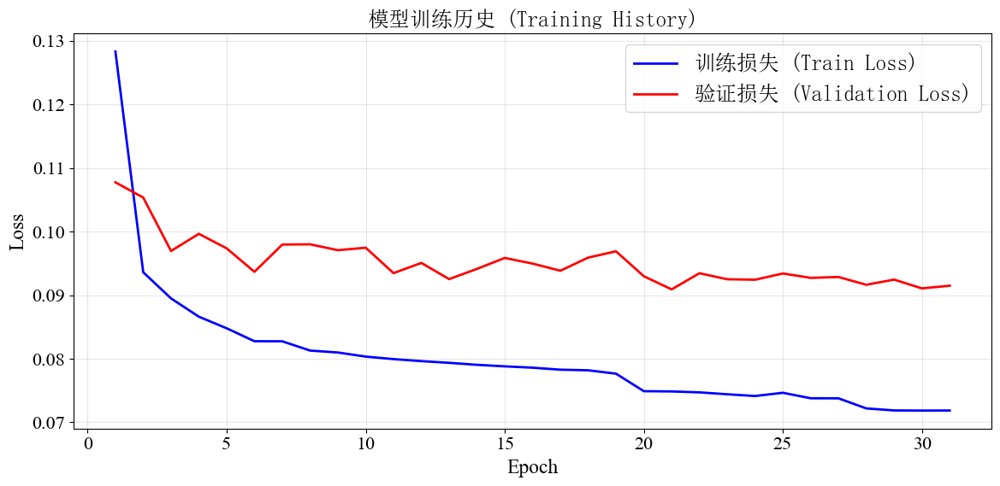

In [8]:
# ============================================================================
# EVALUATION AND VISUALIZATION - 评估和可视化模块
# ============================================================================

class ModelEvaluator:
    """
    模型评估和可视化类
    """
    def __init__(self, model, config, scaler, feature_columns):
        self.model = model
        self.config = config
        self.scaler = scaler
        self.feature_columns = feature_columns
        self.device = config['device']
        
    def predict(self, data_loader):
        """
        生成预测
        """
        self.model.eval()
        all_predictions = []
        all_targets = []
        
        with torch.no_grad():
            for sequences, targets in data_loader:
                sequences = sequences.to(self.device)
                targets = targets.to(self.device)
                
                predictions = self.model(sequences)
                
                all_predictions.append(predictions.cpu().numpy())
                all_targets.append(targets.cpu().numpy())
        
        predictions = np.concatenate(all_predictions, axis=0)
        targets = np.concatenate(all_targets, axis=0)
        
        return predictions, targets
    
    def inverse_transform(self, data):
        """
        反标准化数据
        """
        # data shape: (n_samples, prediction_length, n_features)
        n_samples, pred_len, n_features = data.shape
        data_reshaped = data.reshape(-1, n_features)
        data_inverse = self.scaler.inverse_transform(data_reshaped)
        return data_inverse.reshape(n_samples, pred_len, n_features)
    
    def plot_training_history(self, train_losses, val_losses):
        """
        绘制训练历史
        """
        plt.figure(figsize=CONFIG['plot_config']['figsize'], dpi=CONFIG['plot_config']['dpi'])
        
        epochs = range(1, len(train_losses) + 1)
        plt.plot(epochs, train_losses, 'b-', label='训练损失 (Train Loss)', linewidth=2)
        plt.plot(epochs, val_losses, 'r-', label='验证损失 (Validation Loss)', linewidth=2)
        
        # 使用FontProperties来确保字体正确显示
        chinese_font_prop = CONFIG.get('_chinese_font_prop', fm.FontProperties(size=CONFIG['font_config']['chinese_fontsize']))
        english_font_prop = CONFIG.get('_english_font_prop', fm.FontProperties(size=CONFIG['font_config']['english_fontsize']))
        
        plt.xlabel('Epoch', fontproperties=english_font_prop)
        plt.ylabel('Loss', fontproperties=english_font_prop)
        plt.title('模型训练历史 (Training History)', fontproperties=chinese_font_prop)
        plt.legend(prop=chinese_font_prop, fontsize=CONFIG['font_config']['legend_fontsize'])
        plt.grid(True, alpha=0.3)
        
        # 设置刻度字体
        plt.xticks(fontproperties=english_font_prop, fontsize=CONFIG['font_config']['tick_fontsize'])
        plt.yticks(fontproperties=english_font_prop, fontsize=CONFIG['font_config']['tick_fontsize'])
        
        plt.tight_layout()
        
        if CONFIG['save_plots']:
            save_path = os.path.join(CONFIG['plots_save_path'], 'training_history.png')
            os.makedirs(os.path.dirname(save_path), exist_ok=True)
            plt.savefig(save_path, dpi=CONFIG['plot_config']['save_dpi'], bbox_inches='tight')
            print(f"Plot saved to {save_path}")
        
        plt.show()
    
    def plot_predictions(self, predictions, targets, feature_idx=0, n_samples=None):
        """
        绘制预测结果对比图
        n_samples=None表示使用所有数据
        """
        # 反标准化
        pred_inverse = self.inverse_transform(predictions)
        target_inverse = self.inverse_transform(targets)
        
        # 选择特征
        if n_samples is None:
            n_samples = len(pred_inverse)
        
        pred_feature = pred_inverse[:n_samples, 0, feature_idx]
        target_feature = target_inverse[:n_samples, 0, feature_idx]
        
        feature_name = self.feature_columns[feature_idx] if feature_idx < len(self.feature_columns) else f'Feature {feature_idx}'
        
        # 根据数据量调整图形大小
        fig_width = max(12, min(20, n_samples / 50))
        plt.figure(figsize=(fig_width, CONFIG['plot_config']['figsize'][1]), dpi=CONFIG['plot_config']['dpi'])
        
        x = range(len(pred_feature))
        plt.plot(x, target_feature, 'b-', label='真实值 (True Values)', linewidth=1.5, alpha=0.7)
        plt.plot(x, pred_feature, 'r--', label='预测值 (Predictions)', linewidth=1.5, alpha=0.7)
        
        # 使用FontProperties来确保字体正确显示
        chinese_font_prop = CONFIG.get('_chinese_font_prop', fm.FontProperties(size=CONFIG['font_config']['chinese_fontsize']))
        english_font_prop = CONFIG.get('_english_font_prop', fm.FontProperties(size=CONFIG['font_config']['english_fontsize']))
        
        plt.xlabel('样本序号', fontproperties=chinese_font_prop)
        plt.ylabel('取值', fontproperties=chinese_font_prop)
        plt.title(f'预测结果对比 - {feature_name}', fontproperties=chinese_font_prop)
        plt.legend(prop=chinese_font_prop, fontsize=CONFIG['font_config']['legend_fontsize'])
        plt.grid(True, alpha=0.3)
        
        # 设置刻度字体
        plt.xticks(fontproperties=english_font_prop, fontsize=CONFIG['font_config']['tick_fontsize'])
        plt.yticks(fontproperties=english_font_prop, fontsize=CONFIG['font_config']['tick_fontsize'])
        
        plt.tight_layout()
        
        if CONFIG['save_plots']:
            save_path = os.path.join(CONFIG['plots_save_path'], f'prediction_feature_{feature_idx}.png')
            os.makedirs(os.path.dirname(save_path), exist_ok=True)
            plt.savefig(save_path, dpi=CONFIG['plot_config']['save_dpi'], bbox_inches='tight')
            print(f"Plot saved: {save_path} (showing {n_samples} samples)")
        
        plt.show()
    
    def calculate_metrics(self, predictions, targets):
        """
        计算评估指标
        """
        from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
        
        # 反标准化
        pred_inverse = self.inverse_transform(predictions)
        target_inverse = self.inverse_transform(targets)
        
        # 展平
        pred_flat = pred_inverse.reshape(-1)
        target_flat = target_inverse.reshape(-1)
        
        mse = mean_squared_error(target_flat, pred_flat)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(target_flat, pred_flat)
        r2 = r2_score(target_flat, pred_flat)
        
        metrics = {
            'MSE': mse,
            'RMSE': rmse,
            'MAE': mae,
            'R²': r2
        }
        
        return metrics

# 初始化评估器
evaluator = ModelEvaluator(model, CONFIG, data_loader.scaler, data_loader.feature_columns)

# 绘制训练历史
evaluator.plot_training_history(train_losses, val_losses)

Full test set size: 21185 samples
Number of features: 31

Using last 50% of test set: 10593 samples
(This represents the last 25% of the entire dataset)

Test Set Metrics (last 50% of test set):
----------------------------------------
MSE: 645264.812500
RMSE: 803.283768
MAE: 71.316368
R²: 0.962322
----------------------------------------

Plotting predictions for all 31 features...

[1/31] Plotting predictions for: 管理行程
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_0.png (showing 10593 samples)


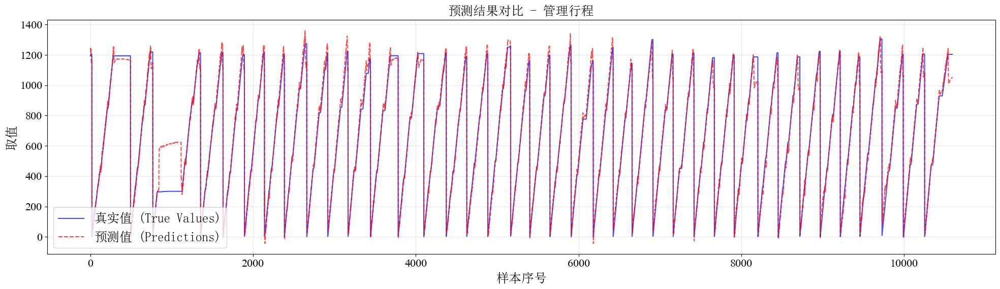


[2/31] Plotting predictions for: 贯入度
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_1.png (showing 10593 samples)


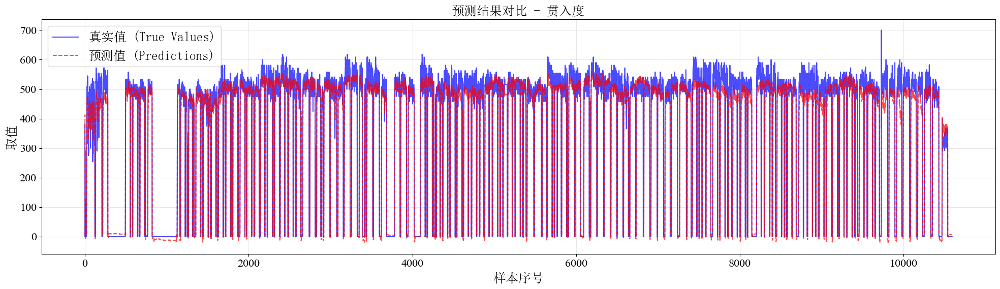


[3/31] Plotting predictions for: 推进区间的压力（上）
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_2.png (showing 10593 samples)


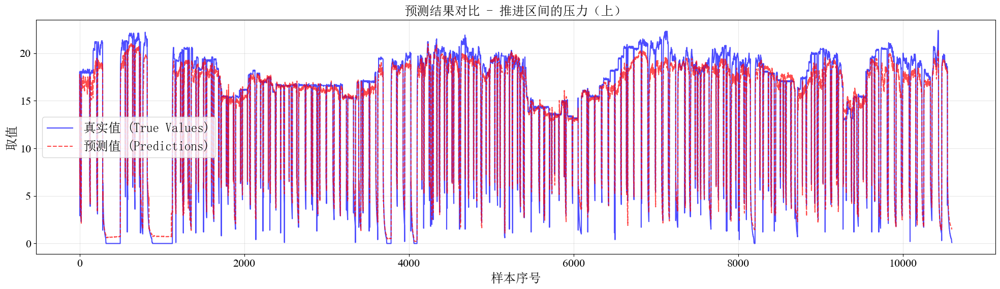


[4/31] Plotting predictions for: 推进区间的压力（右）
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_3.png (showing 10593 samples)


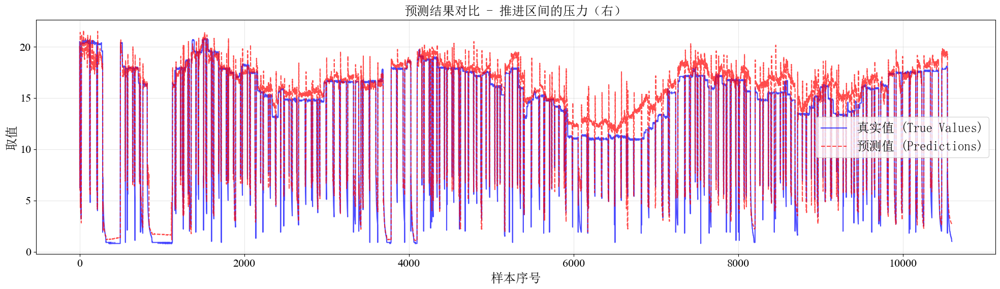


[5/31] Plotting predictions for: 推进区间的压力（下）
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_4.png (showing 10593 samples)


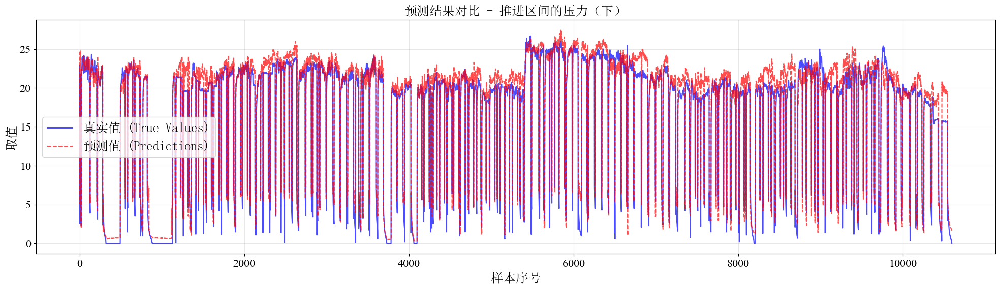


[6/31] Plotting predictions for: 推进区间的压力（左）
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_5.png (showing 10593 samples)


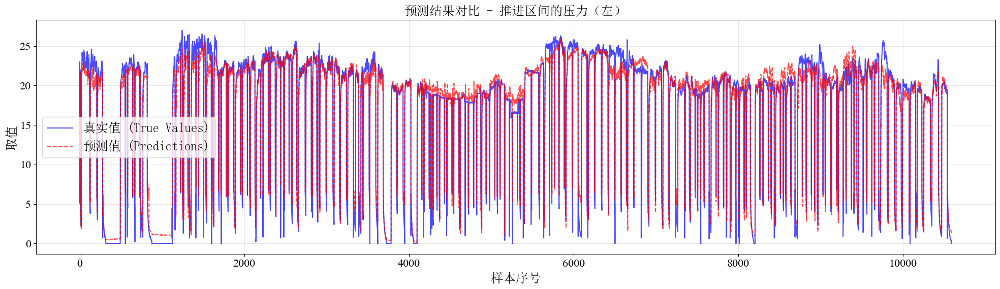


[7/31] Plotting predictions for: 土舱土压（右下）
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_6.png (showing 10593 samples)


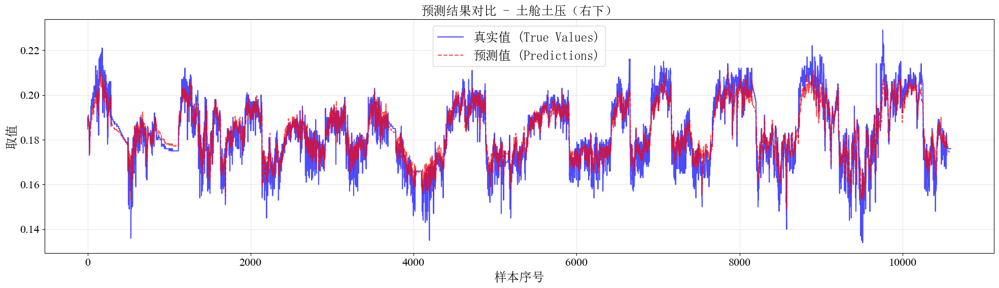


[8/31] Plotting predictions for: 土舱土压（左下）
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_7.png (showing 10593 samples)


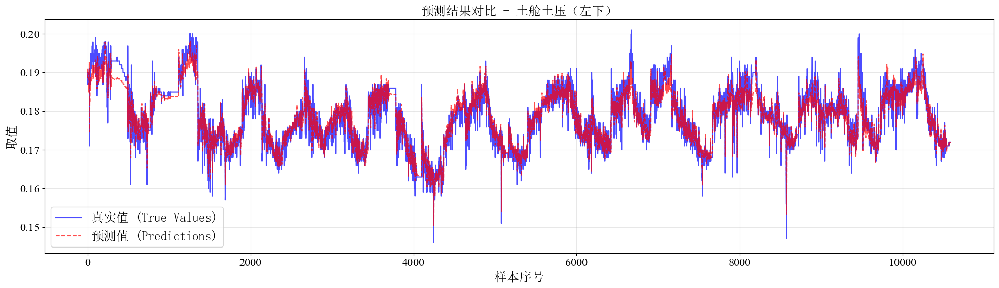


[9/31] Plotting predictions for: No.16推进千斤顶速度
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_8.png (showing 10593 samples)


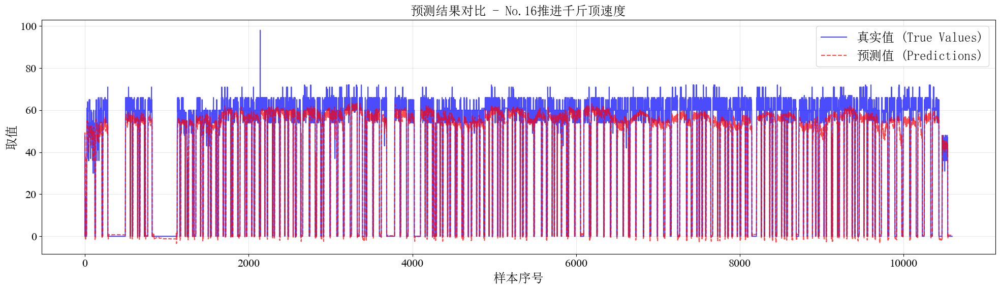


[10/31] Plotting predictions for: No.4推进千斤顶速度
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_9.png (showing 10593 samples)


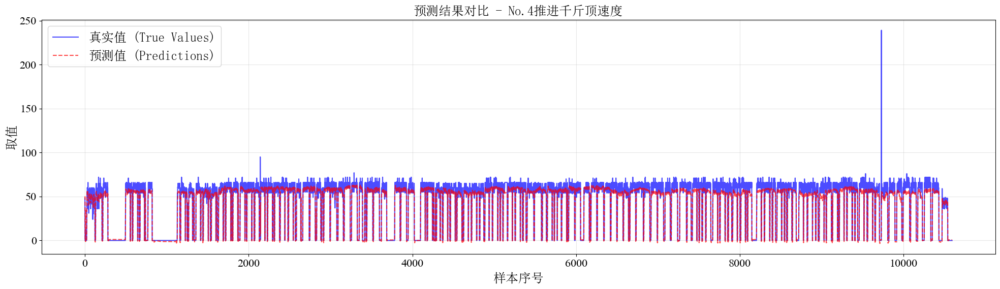


[11/31] Plotting predictions for: No.8推进千斤顶速度
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_10.png (showing 10593 samples)


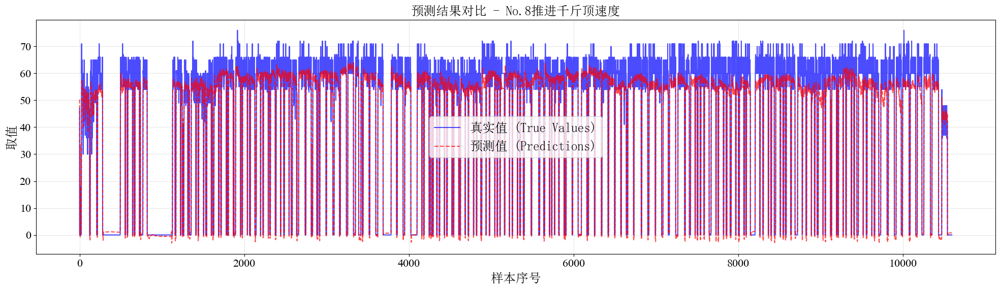


[12/31] Plotting predictions for: No.12推进千斤顶速度
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_11.png (showing 10593 samples)


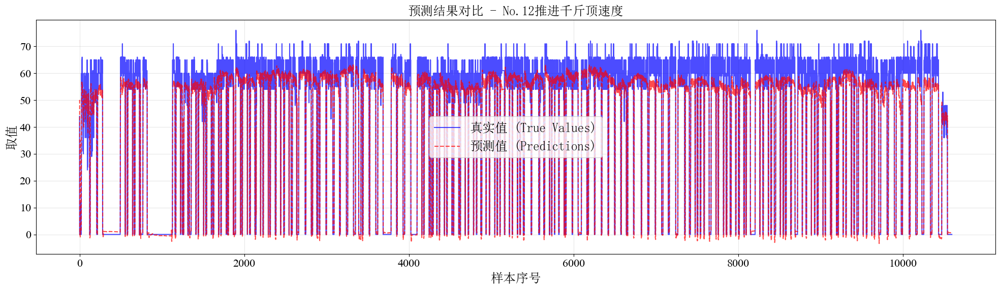


[13/31] Plotting predictions for: 推进油缸总推力
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_12.png (showing 10593 samples)


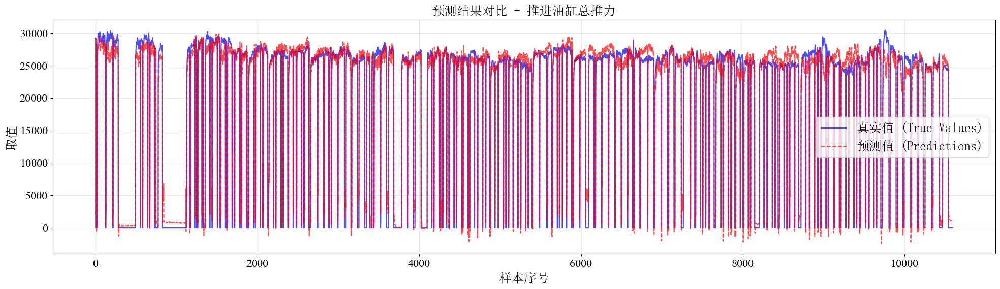


[14/31] Plotting predictions for: No.16推进千斤顶行程
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_13.png (showing 10593 samples)


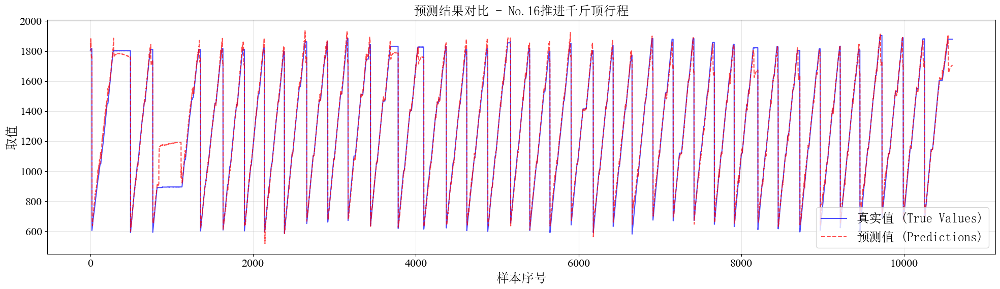


[15/31] Plotting predictions for: No.4推进千斤顶行程
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_14.png (showing 10593 samples)


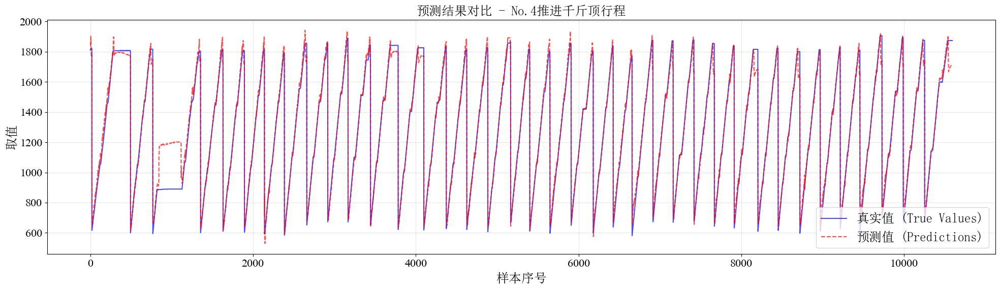


[16/31] Plotting predictions for: No.8推进千斤顶行程
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_15.png (showing 10593 samples)


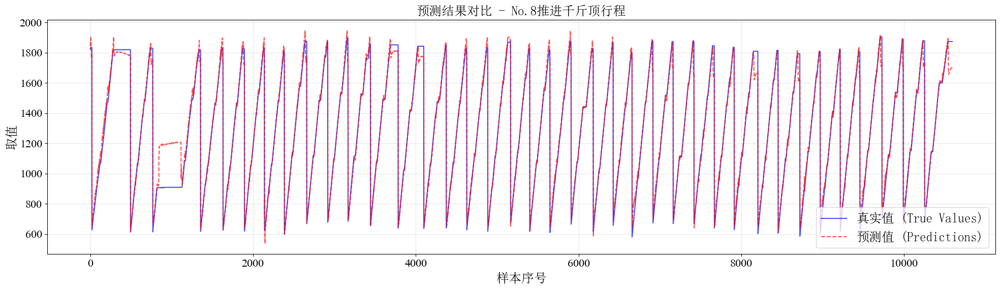


[17/31] Plotting predictions for: No.12推进千斤顶行程
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_16.png (showing 10593 samples)


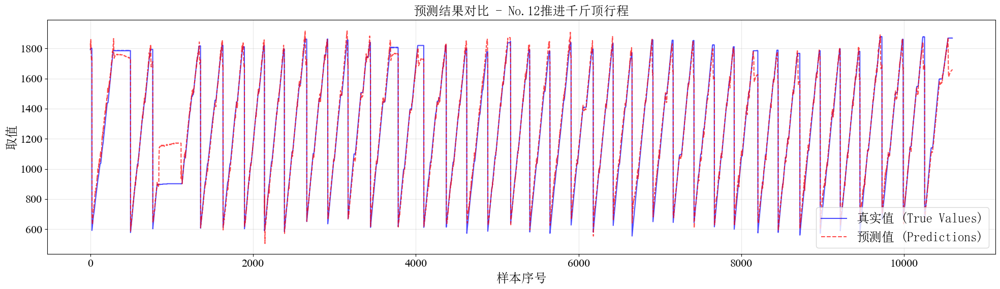


[18/31] Plotting predictions for: 千斤顶行程差 上下
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_17.png (showing 10593 samples)


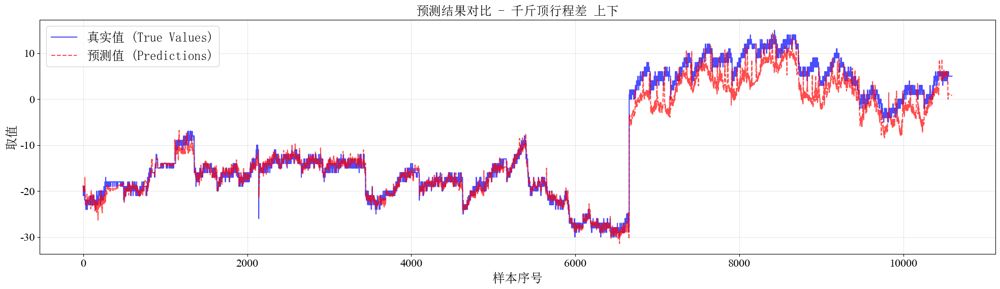


[19/31] Plotting predictions for: 推进平均速度
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_18.png (showing 10593 samples)


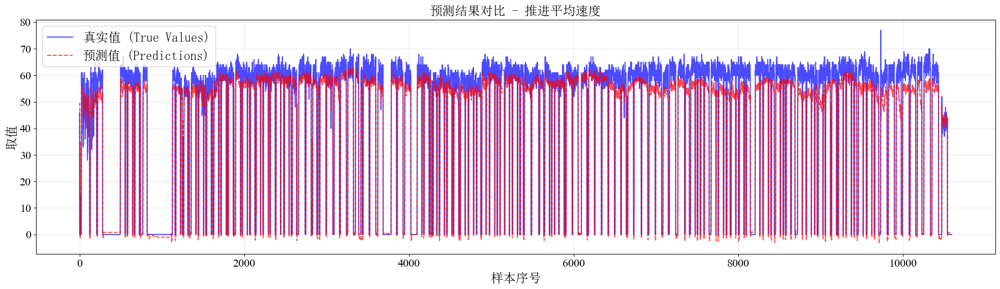


[20/31] Plotting predictions for: 刀盘转速
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_19.png (showing 10593 samples)


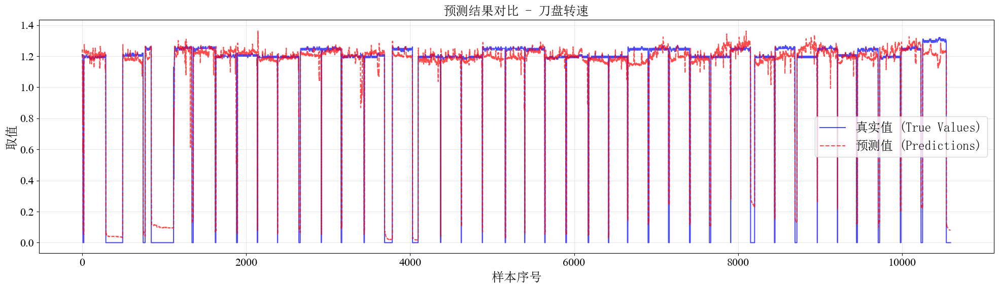


[21/31] Plotting predictions for: 刀盘扭矩
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_20.png (showing 10593 samples)


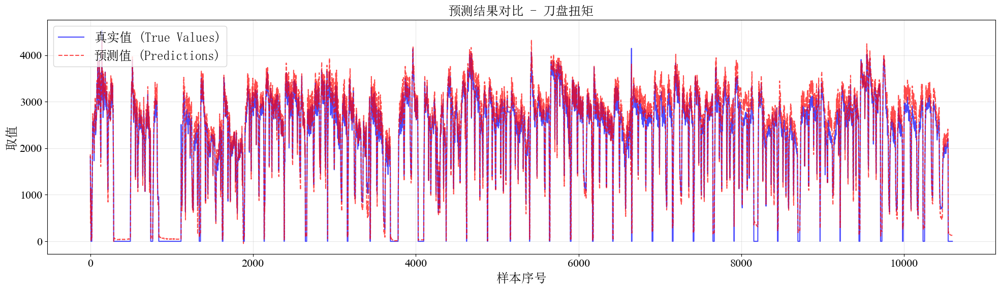


[22/31] Plotting predictions for: No.1刀盘电机扭矩
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_21.png (showing 10593 samples)


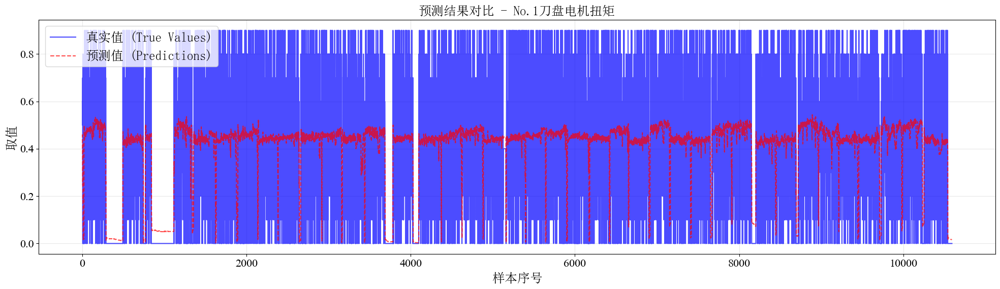


[23/31] Plotting predictions for: No.2刀盘电机扭矩
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_22.png (showing 10593 samples)


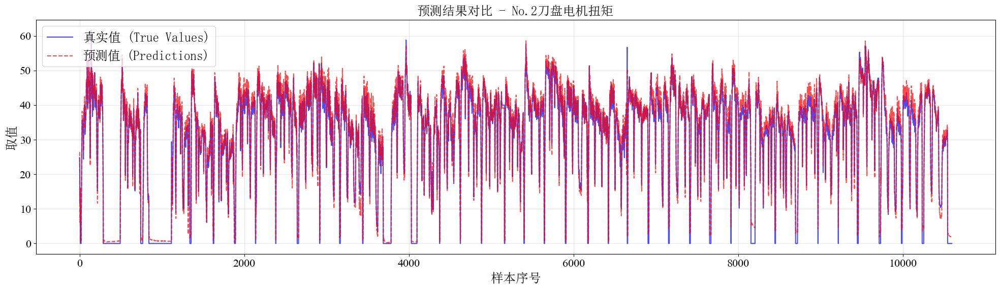


[24/31] Plotting predictions for: No.3刀盘电机扭矩
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_23.png (showing 10593 samples)


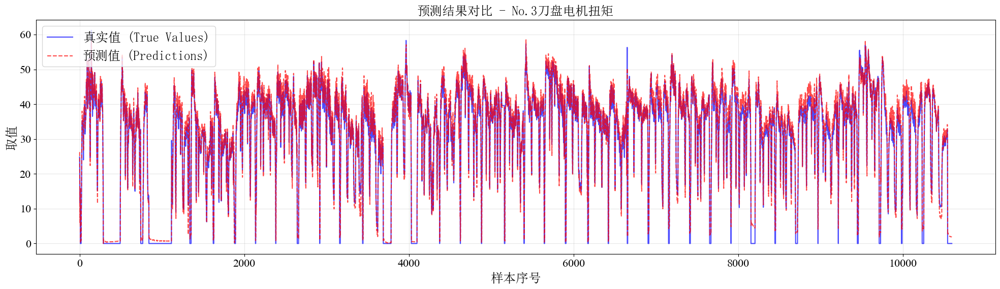


[25/31] Plotting predictions for: No.4刀盘电机扭矩
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_24.png (showing 10593 samples)


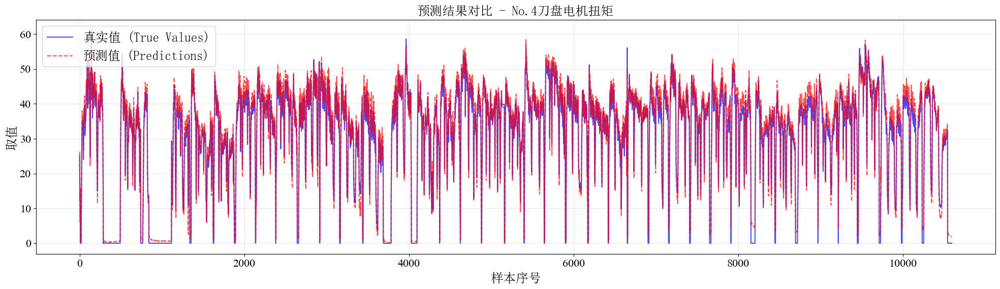


[26/31] Plotting predictions for: No.5刀盘电机扭矩
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_25.png (showing 10593 samples)


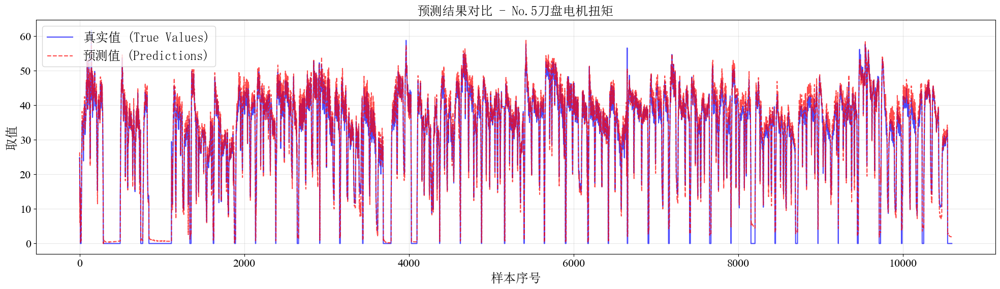


[27/31] Plotting predictions for: No.6刀盘电机扭矩
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_26.png (showing 10593 samples)


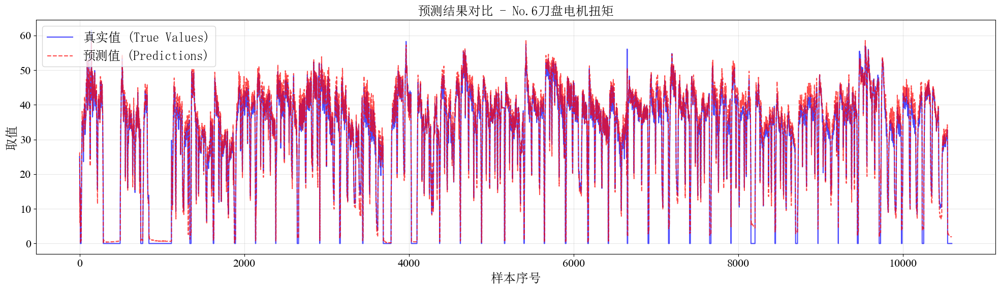


[28/31] Plotting predictions for: No.7刀盘电机扭矩
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_27.png (showing 10593 samples)


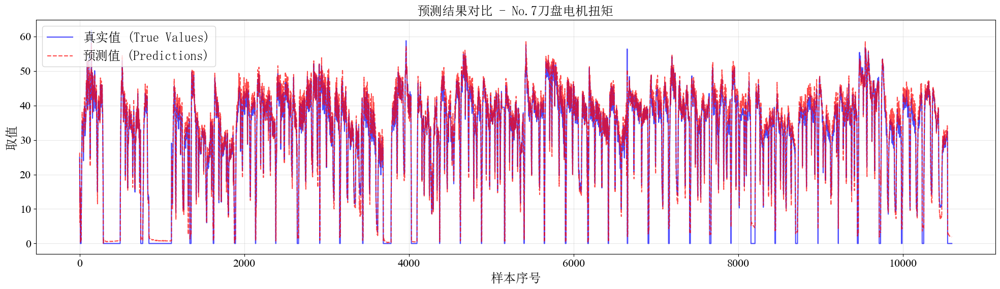


[29/31] Plotting predictions for: No.8刀盘电机扭矩
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_28.png (showing 10593 samples)


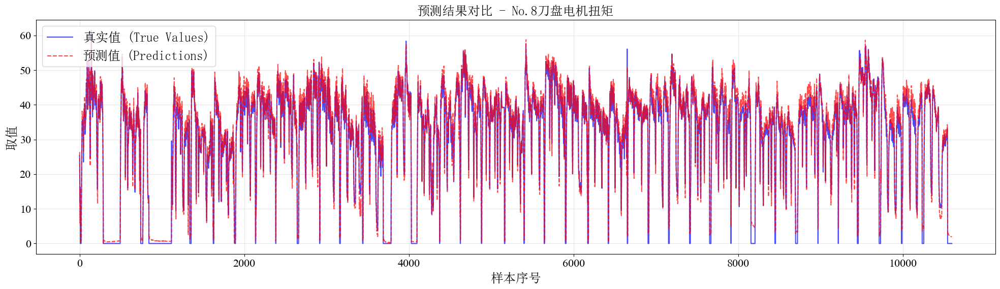


[30/31] Plotting predictions for: No.9刀盘电机扭矩
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_29.png (showing 10593 samples)


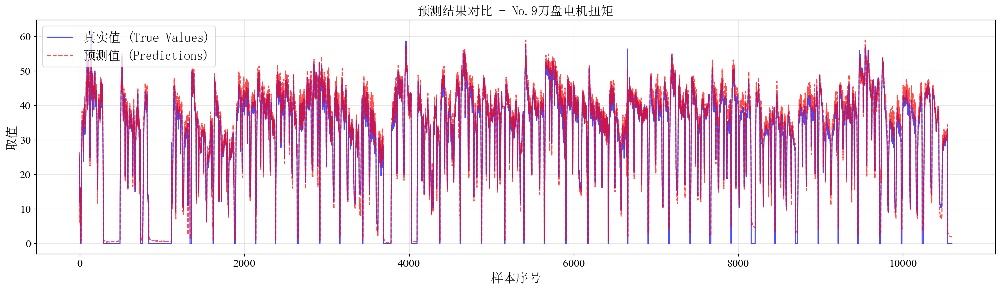


[31/31] Plotting predictions for: No.10刀盘电机扭矩
  (Using last 50% of test set: 10593 samples)
Plot saved: ./results/plots/prediction_feature_30.png (showing 10593 samples)


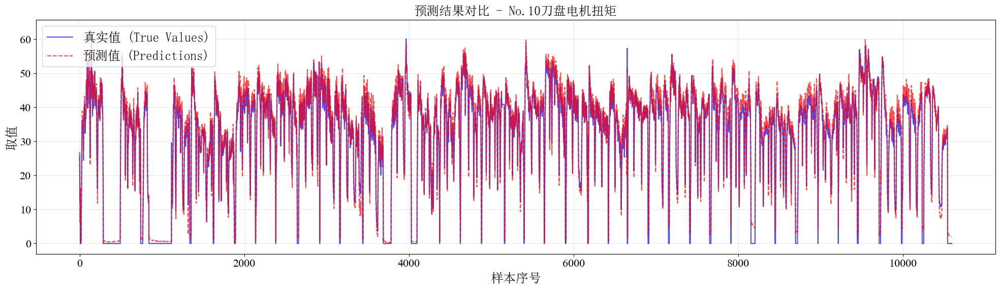


All 31 feature plots completed!


In [9]:
# ============================================================================
# TEST SET EVALUATION - 测试集评估
# ============================================================================

# 在测试集上评估
test_predictions, test_targets = evaluator.predict(test_loader)

print(f"Full test set size: {len(test_predictions)} samples")
print(f"Number of features: {len(data_loader.feature_columns)}")

# 使用测试集的后50%（即整个数据的后25%）
test_half_idx = len(test_predictions) // 2
test_predictions_half = test_predictions[test_half_idx:]
test_targets_half = test_targets[test_half_idx:]

print(f"\nUsing last 50% of test set: {len(test_predictions_half)} samples")
print(f"(This represents the last 25% of the entire dataset)")

# 计算评估指标（使用后50%的测试数据）
test_metrics = evaluator.calculate_metrics(test_predictions_half, test_targets_half)

print("\nTest Set Metrics (last 50% of test set):")
print("-" * 40)
for metric_name, metric_value in test_metrics.items():
    print(f"{metric_name}: {metric_value:.6f}")
print("-" * 40)

# 绘制所有特征的预测结果（使用测试集的后50%）
print(f"\nPlotting predictions for all {len(data_loader.feature_columns)} features...")
print("=" * 60)

for i, feature_name in enumerate(data_loader.feature_columns):
    feature_idx = i
    print(f"\n[{i+1}/{len(data_loader.feature_columns)}] Plotting predictions for: {feature_name}")
    print(f"  (Using last 50% of test set: {len(test_predictions_half)} samples)")
    evaluator.plot_predictions(test_predictions_half, test_targets_half, feature_idx=feature_idx, n_samples=None)

print("\n" + "=" * 60)
print(f"All {len(data_loader.feature_columns)} feature plots completed!")

In [10]:
# ============================================================================
# SAVE PREDICTIONS - 保存预测结果
# ============================================================================

if CONFIG['save_predictions']:
    # 使用测试集的后50%（如果已定义，否则使用全部测试数据）
    if 'test_predictions_half' in globals() and 'test_targets_half' in globals():
        predictions_to_save = test_predictions_half
        targets_to_save = test_targets_half
        print(f"Saving predictions for last 50% of test set: {len(predictions_to_save)} samples")
    else:
        predictions_to_save = test_predictions
        targets_to_save = test_targets
        print(f"Saving predictions for full test set: {len(predictions_to_save)} samples")
    
    # 反标准化预测和目标
    pred_inverse = evaluator.inverse_transform(predictions_to_save)
    target_inverse = evaluator.inverse_transform(targets_to_save)
    
    # 创建DataFrame
    results_data = []
    for i in range(len(pred_inverse)):
        for j, feature_name in enumerate(data_loader.feature_columns):
            results_data.append({
                'Sample': i,
                'Feature': feature_name,
                'True_Value': target_inverse[i, 0, j],
                'Predicted_Value': pred_inverse[i, 0, j],
                'Error': target_inverse[i, 0, j] - pred_inverse[i, 0, j],
                'Absolute_Error': np.abs(target_inverse[i, 0, j] - pred_inverse[i, 0, j])
            })
    
    results_df = pd.DataFrame(results_data)
    
    # 保存
    os.makedirs(os.path.dirname(CONFIG['predictions_save_path']), exist_ok=True)
    results_df.to_csv(CONFIG['predictions_save_path'], index=False, encoding='utf-8-sig')
    print(f"Predictions saved to {CONFIG['predictions_save_path']}")
    
    # 显示前几行
    print("\nFirst few predictions:")
    print(results_df.head(10))

Saving predictions for last 50% of test set: 10593 samples
Predictions saved to ./results/predictions.csv

First few predictions:
   Sample       Feature  True_Value  Predicted_Value      Error  \
0       0          管理行程    1194.000      1237.249756 -43.249756   
1       0           贯入度     383.000       407.444000 -24.444000   
2       0    推进区间的压力（上）      18.000        17.709509   0.290491   
3       0    推进区间的压力（右）      20.500        19.783382   0.716618   
4       0    推进区间的压力（下）      22.900        24.306595  -1.406595   
5       0    推进区间的压力（左）      23.000        22.238771   0.761229   
6       0      土舱土压（右下）       0.186         0.185285   0.000715   
7       0      土舱土压（左下）       0.187         0.188488  -0.001488   
8       0  No.16推进千斤顶速度      48.000        48.202587  -0.202587   
9       0   No.4推进千斤顶速度      48.000        49.030418  -1.030418   

   Absolute_Error  
0       43.249756  
1       24.444000  
2        0.290491  
3        0.716618  
4        1.406595  
5        0.7